In [1]:
import torch
import torch.optim as optim
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision import datasets as dset
import matplotlib.pyplot as plt
import numpy as np
import os
import random

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"device use : {device}")

def seed_everything(seed: int = 2):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = True 
    
seed_everything()

device use : cuda:0


# Generator

In [2]:
# input is noise
class Generator(nn.Module):
    def __init__(self, input_dim = 128, hidden_dims = [256, 512, 1024], original_img_size = [28, 28], image_channel = 1, norm = False):
        super(Generator, self).__init__()
        self.net = nn.Sequential()
        self.img_size = original_img_size
        self.img_channel = image_channel
        self.out_dim = np.prod(self.img_size) * image_channel
        layers = []
        pre_dim = input_dim
        for hdim in hidden_dims:
            layers.append(nn.Linear(pre_dim, hdim))
            if norm :
                layers.append(nn.BatchNorm1d(hdim), 0.8)
            layers.append(nn.ReLU(True))
            pre_dim = hdim
        layers.append(nn.Linear(pre_dim, self.out_dim))
        layers.append(nn.Tanh())
        
        for idx, layer in enumerate(layers):
            layer_name = f"{type(layer).__name__.lower()}_{idx}"
            self.net.add_module(layer_name, layer)
    
    def forward(self, x):
        image = self.net(x)
        image = image.view(image.shape[0], self.img_channel, self.img_size[0], self.img_size[1])
        return image

# Discriminator

In [3]:
class Discriminator(nn.Module):
    def __init__(self, input_dim = 28 * 28, hidden_dims = [1024, 512, 256, 128], output_dim = 1):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential()
        layers = []
        pre_dim = input_dim
        for hdim in hidden_dims :
            layers.append(nn.Linear(pre_dim, hdim))
            layers.append(nn.ReLU(True))
            pre_dim = hdim
        layers.append(nn.Linear(pre_dim,output_dim))
        layers.append(nn.Sigmoid())
        for idx, layer in enumerate(layers):
            layer_name = f"{type(layer).__name__.lower()}_{idx}"
            self.net.add_module(layer_name, layer)
                
    def forward(self, x):
        return self.net(x.view(x.shape[0], -1))

In [4]:
sample_noise = torch.FloatTensor(np.random.randn(100, 128)).to(device)
#sample_noise = torch.FloatTensor(np.random.normal(0, 1, (16, 128))).to(device)
def show_image(images, epoch):
    fig = plt.figure(figsize = (8, 8))
    columns = 10
    rows = 10
    for i in range(1, images.shape[0] + 1):
        fig.add_subplot(rows, columns, i)
        plt.imshow(images[i - 1].permute(1, 2, 0), cmap = "gray", vmin = -1, vmax = 1)
    plt.savefig(f'./generated_samples/sampleepoch{epoch:03}.png')
    plt.show()

In [5]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize([0.5],[0.5])])

In [6]:
batch_size = 100

mnist_dataset = dset.MNIST(root = "data/MNIST", 
                          train = True, 
                          transform = transform, 
                          download = True)

data_iter = DataLoader(mnist_dataset, batch_size = batch_size, shuffle = True)

learning_rate = 1e-4
epochs = 100
critrion = nn.BCELoss()
G = Generator().to(device)
D = Discriminator().to(device)
G_optim = optim.Adam(G.parameters(), lr = learning_rate)
D_optim = optim.Adam(D.parameters(), lr = learning_rate)

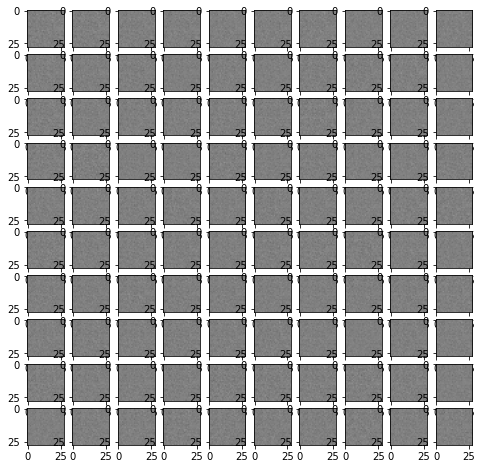

Generator(
  (net): Sequential(
    (linear_0): Linear(in_features=128, out_features=256, bias=True)
    (relu_1): ReLU(inplace=True)
    (linear_2): Linear(in_features=256, out_features=512, bias=True)
    (relu_3): ReLU(inplace=True)
    (linear_4): Linear(in_features=512, out_features=1024, bias=True)
    (relu_5): ReLU(inplace=True)
    (linear_6): Linear(in_features=1024, out_features=784, bias=True)
    (tanh_7): Tanh()
  )
)

In [7]:
G.eval()
with torch.no_grad():
    sample_out = G(sample_noise)
    show_image(sample_out.cpu(), 0)
G.train()

epoch : 00 D_loss : 0.0063194 G_loss :  0.019752


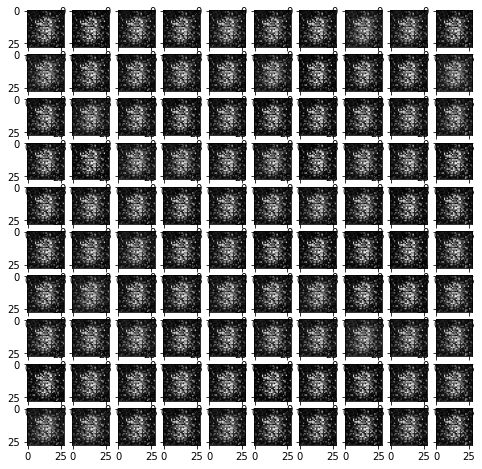

epoch : 01 D_loss : 0.0015682 G_loss :  0.051417


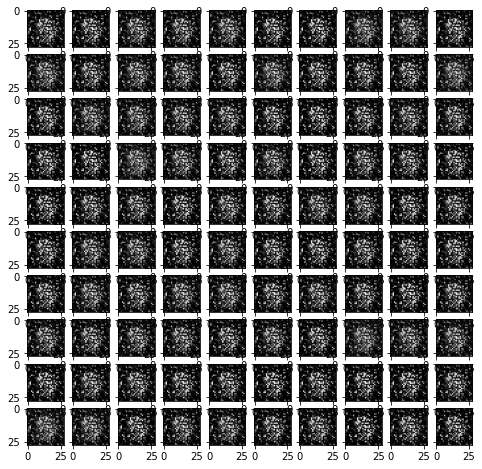

epoch : 02 D_loss : 0.00072507 G_loss :  0.057822


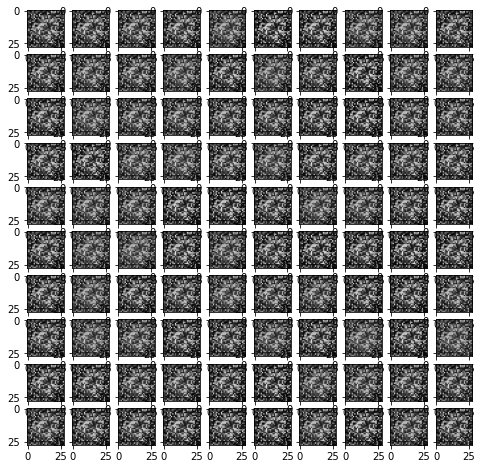

epoch : 03 D_loss : 0.0011063 G_loss :  0.080065


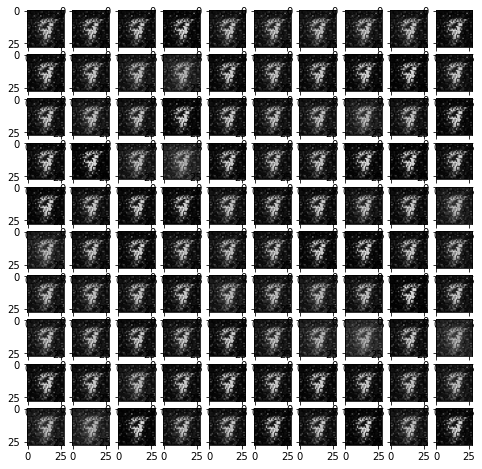

epoch : 04 D_loss : 0.00053429 G_loss :  0.075499


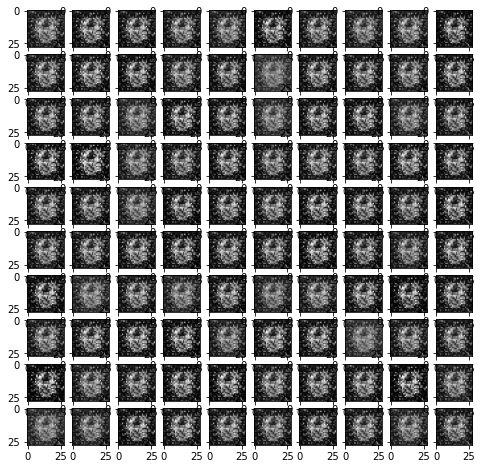

epoch : 05 D_loss : 0.0006815 G_loss :  0.089536


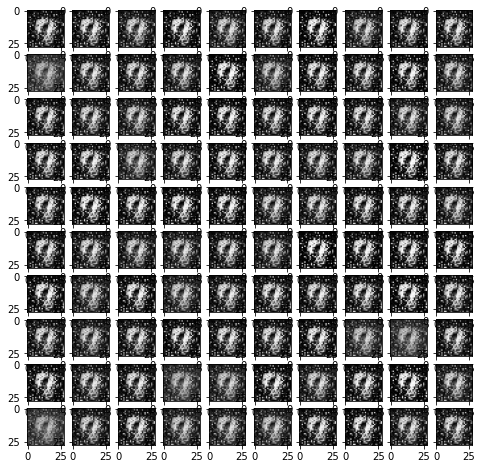

epoch : 06 D_loss : 0.00054991 G_loss :  0.1039


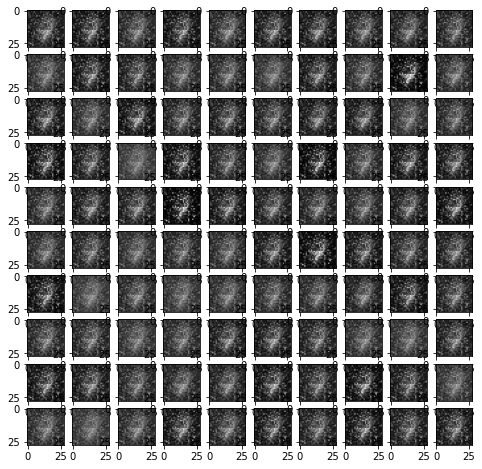

epoch : 07 D_loss : 0.00069878 G_loss :  0.08961


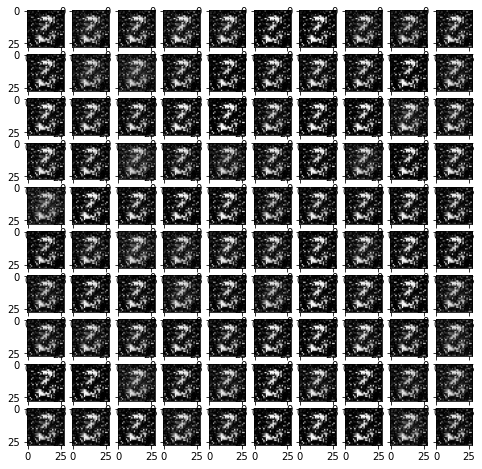

epoch : 08 D_loss : 0.00056387 G_loss :  0.08229


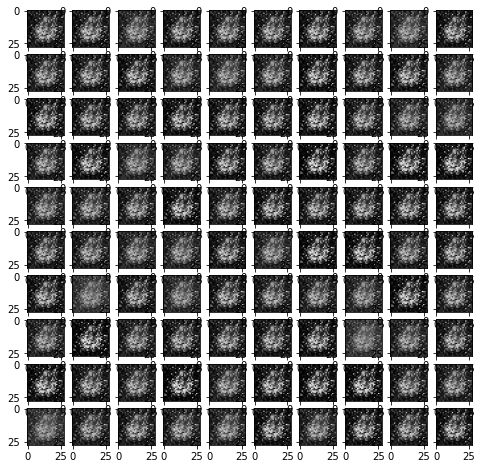

epoch : 09 D_loss : 0.0012704 G_loss :  0.090927


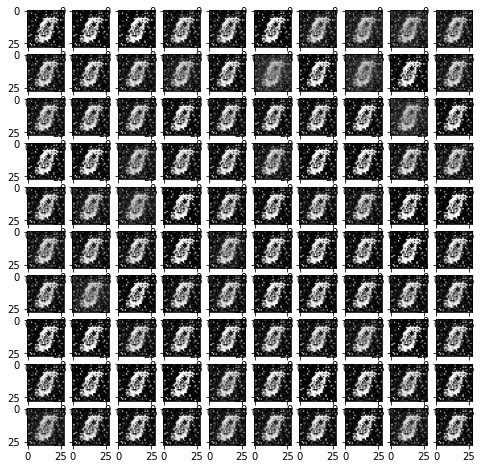

epoch : 10 D_loss : 0.0004864 G_loss :  0.10364


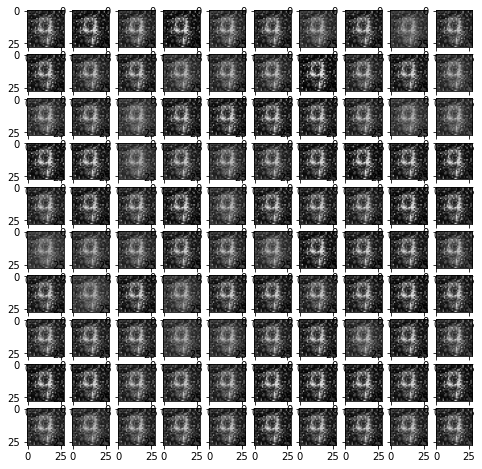

epoch : 11 D_loss : 0.0007667 G_loss :  0.073502


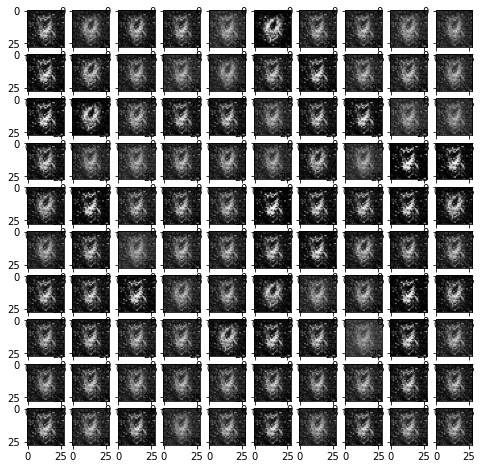

epoch : 12 D_loss : 0.00085486 G_loss :  0.072018


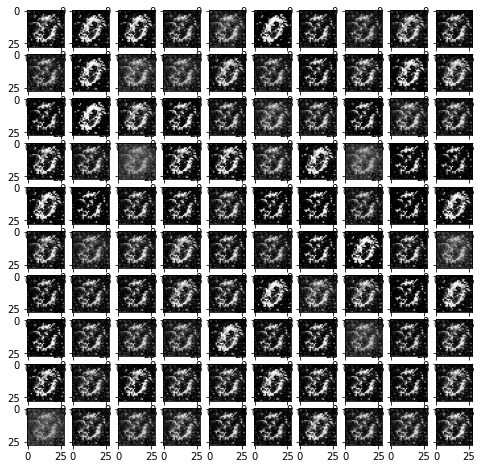

epoch : 13 D_loss : 0.0005099 G_loss :  0.073654


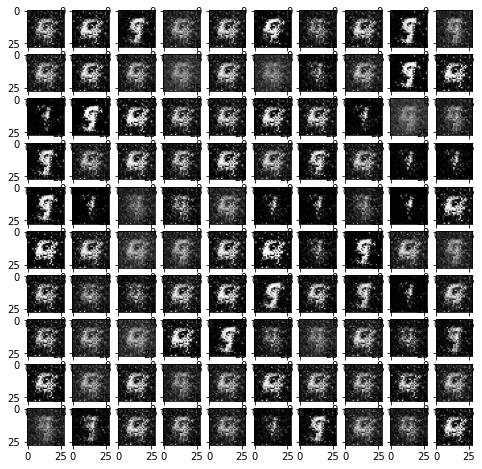

epoch : 14 D_loss : 0.00064403 G_loss :  0.073135


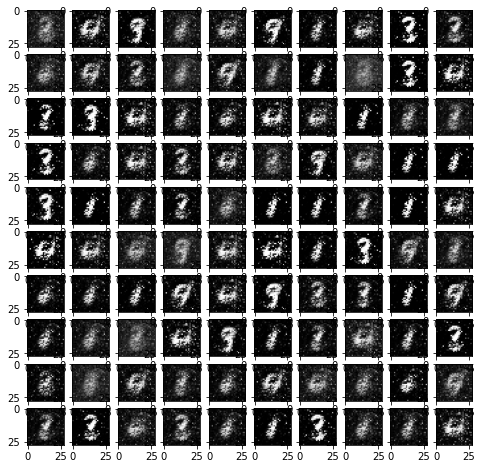

epoch : 15 D_loss : 0.00088351 G_loss :  0.069865


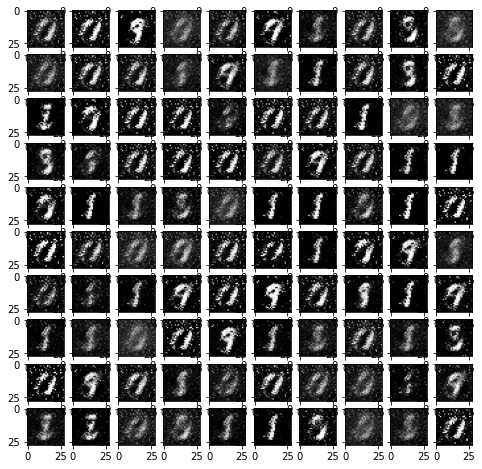

epoch : 16 D_loss : 0.0011064 G_loss :  0.058595


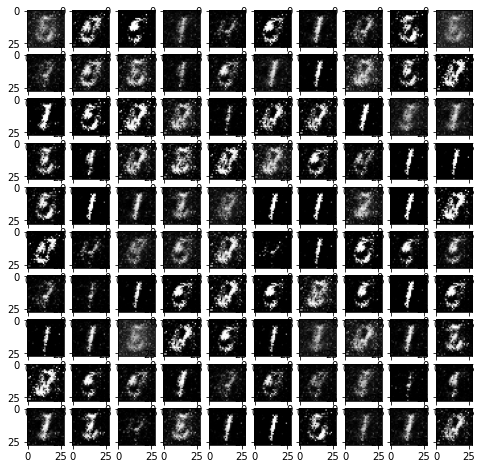

epoch : 17 D_loss : 0.00097544 G_loss :  0.057178


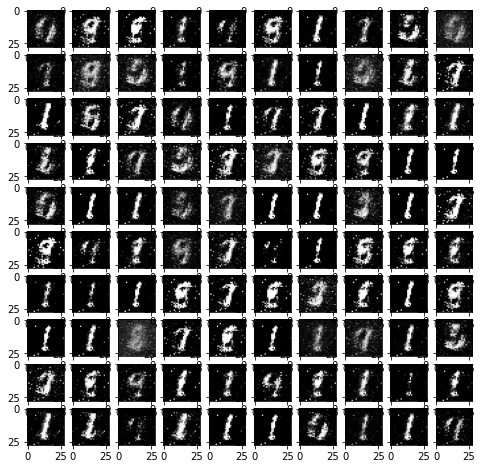

epoch : 18 D_loss : 0.0012312 G_loss :  0.051998


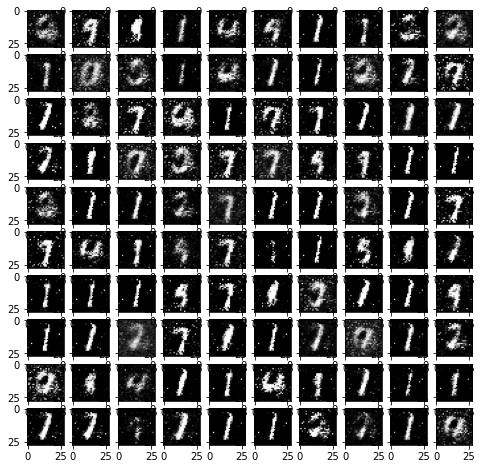

epoch : 19 D_loss : 0.0020042 G_loss :  0.042153


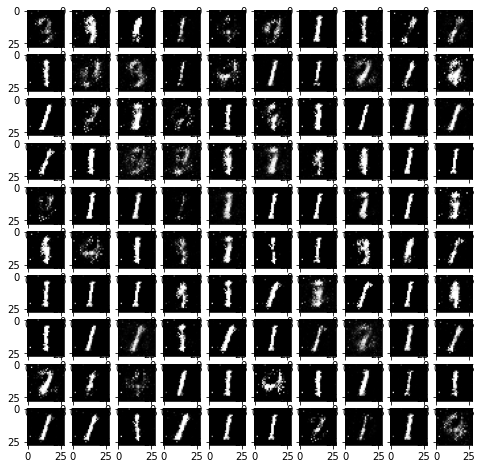

epoch : 20 D_loss : 0.0021169 G_loss :  0.038585


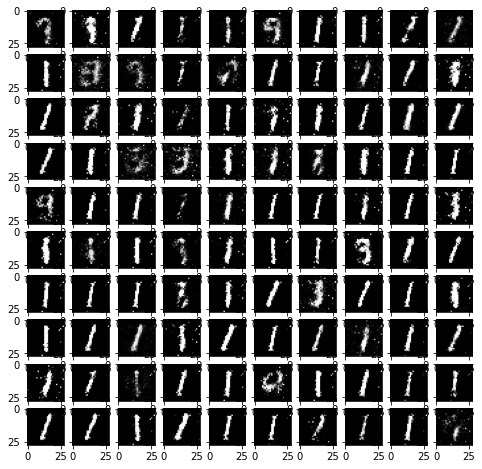

epoch : 21 D_loss : 0.0022831 G_loss :  0.035103


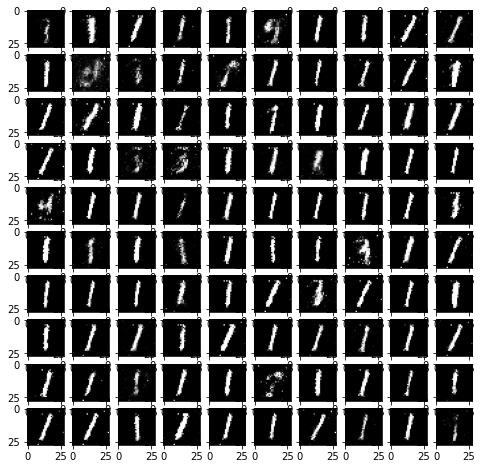

epoch : 22 D_loss : 0.0027744 G_loss :  0.030886


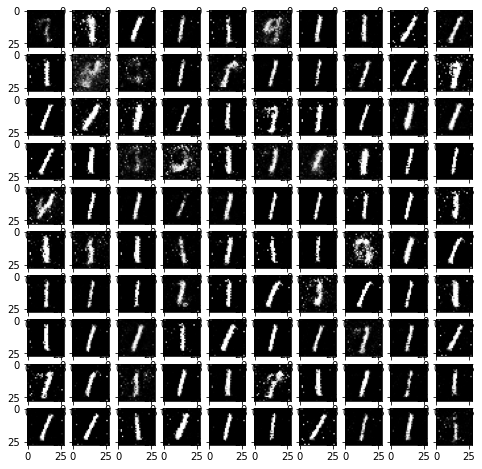

epoch : 23 D_loss : 0.0030874 G_loss :  0.02936


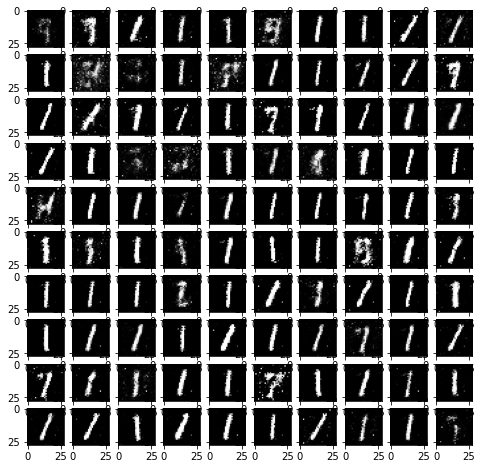

epoch : 24 D_loss : 0.0033318 G_loss :  0.027485


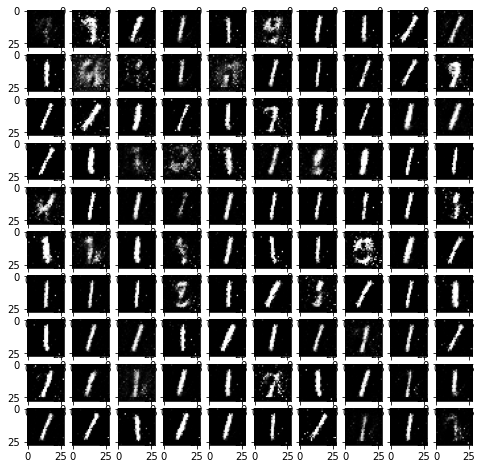

epoch : 25 D_loss : 0.0035995 G_loss :  0.025345


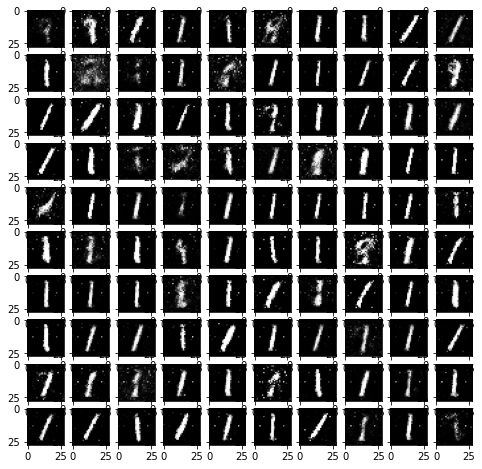

epoch : 26 D_loss : 0.0036365 G_loss :  0.024485


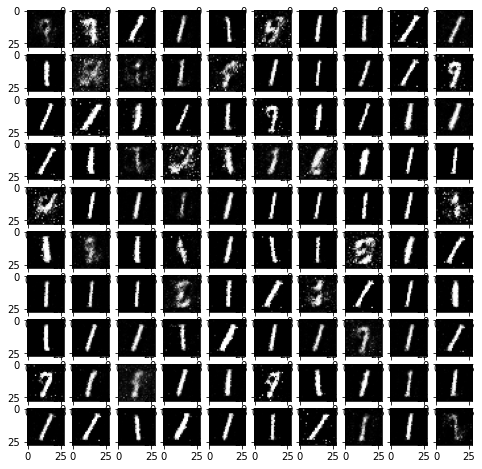

epoch : 27 D_loss : 0.0038039 G_loss :  0.023966


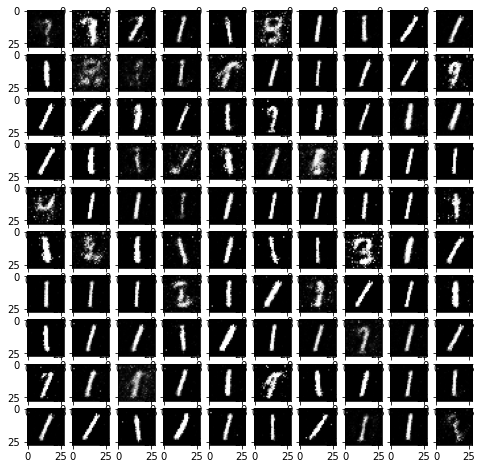

epoch : 28 D_loss : 0.0038538 G_loss :  0.023128


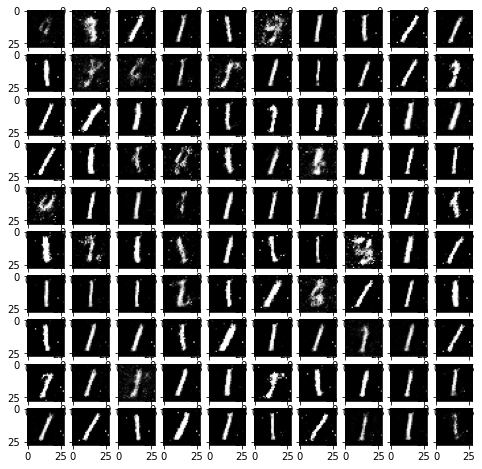

epoch : 29 D_loss : 0.003947 G_loss :  0.023713


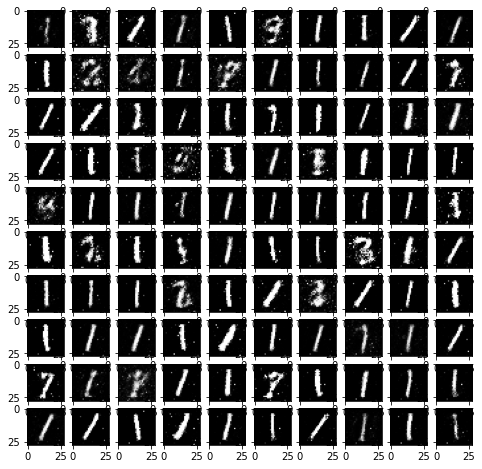

epoch : 30 D_loss : 0.0042051 G_loss :  0.02221


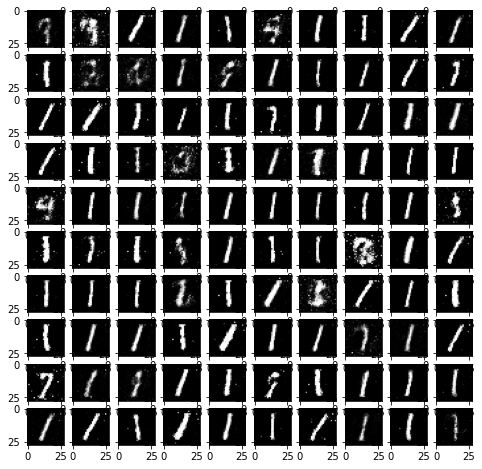

epoch : 31 D_loss : 0.0044375 G_loss :  0.02078


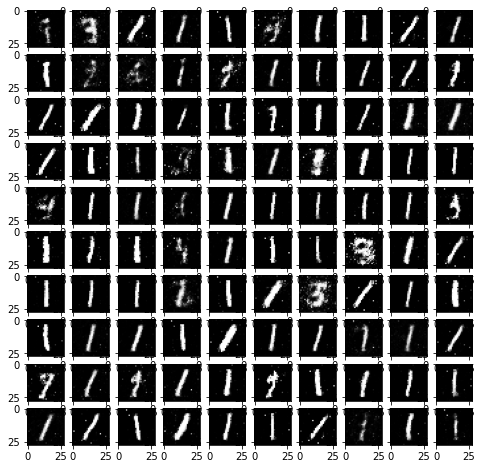

epoch : 32 D_loss : 0.0044196 G_loss :  0.021067


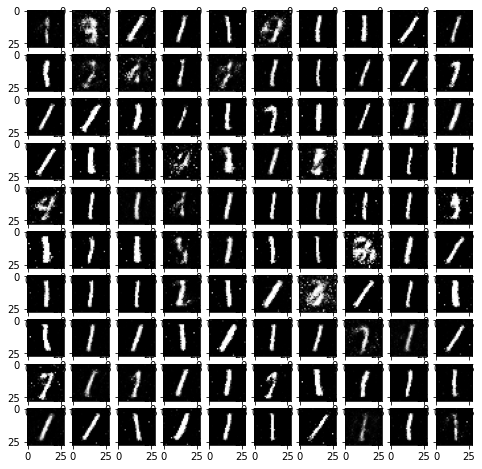

epoch : 33 D_loss : 0.0045606 G_loss :  0.019648


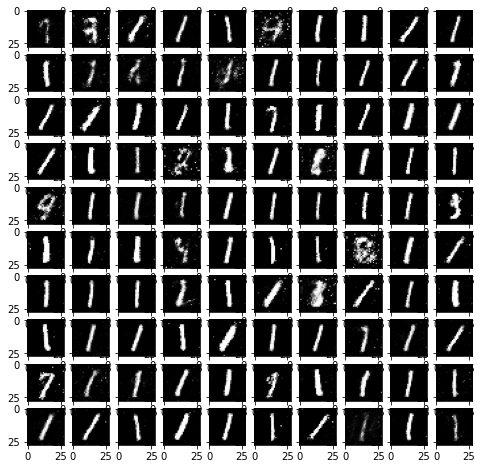

epoch : 34 D_loss : 0.0046342 G_loss :  0.019446


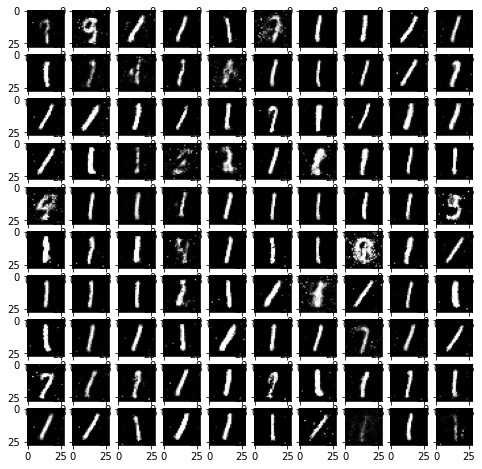

epoch : 35 D_loss : 0.0047703 G_loss :  0.019188


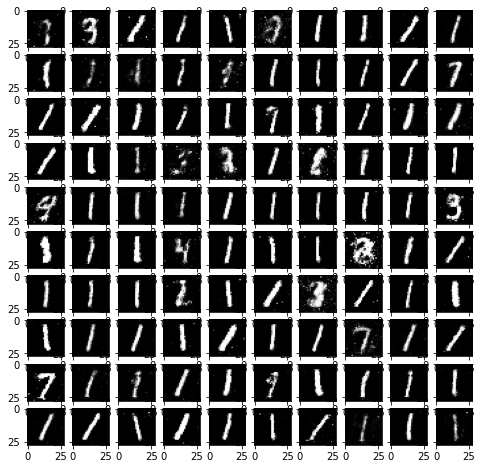

epoch : 36 D_loss : 0.0048639 G_loss :  0.019283


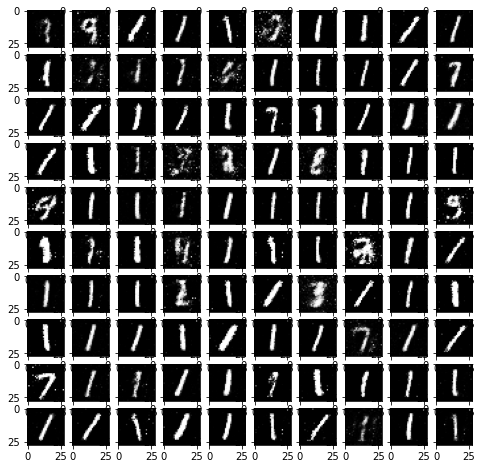

epoch : 37 D_loss : 0.0049058 G_loss :  0.019465


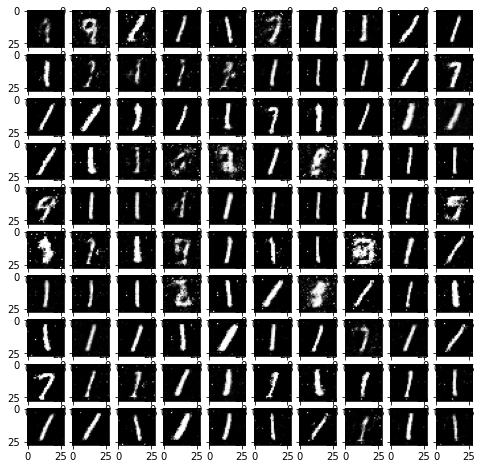

epoch : 38 D_loss : 0.0050777 G_loss :  0.018286


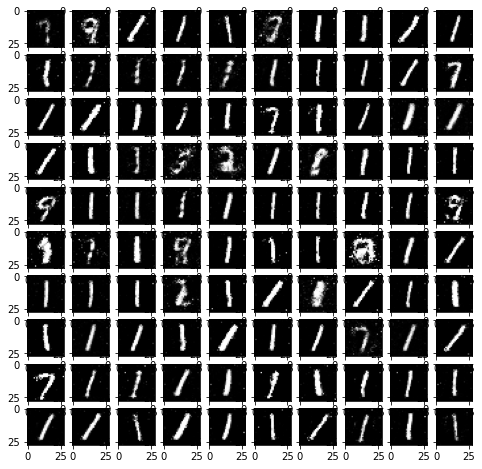

epoch : 39 D_loss : 0.0050862 G_loss :  0.018614


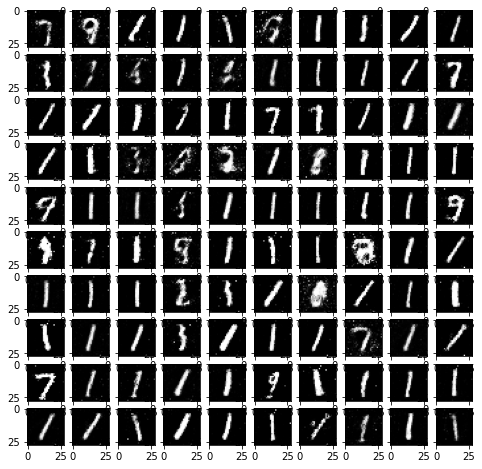

epoch : 40 D_loss : 0.0052132 G_loss :  0.017854


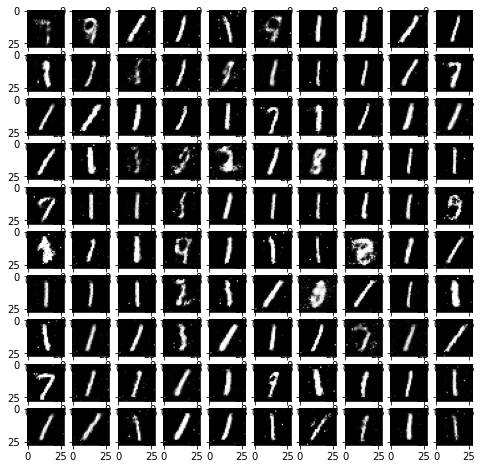

epoch : 41 D_loss : 0.0051713 G_loss :  0.018515


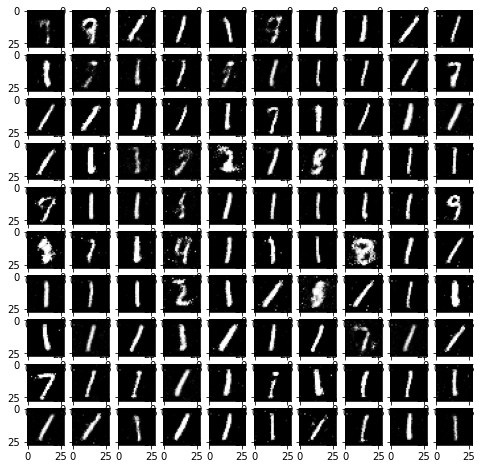

epoch : 42 D_loss : 0.0053402 G_loss :  0.017849


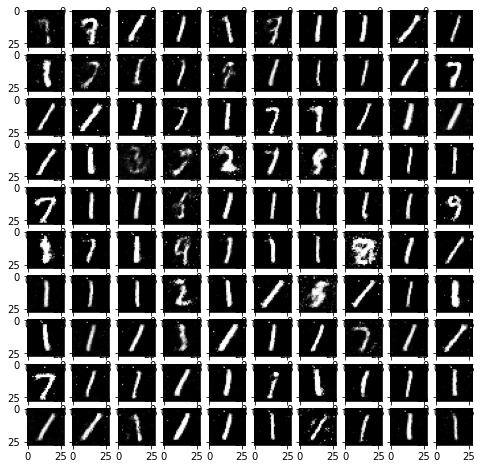

epoch : 43 D_loss : 0.0053778 G_loss :  0.01733


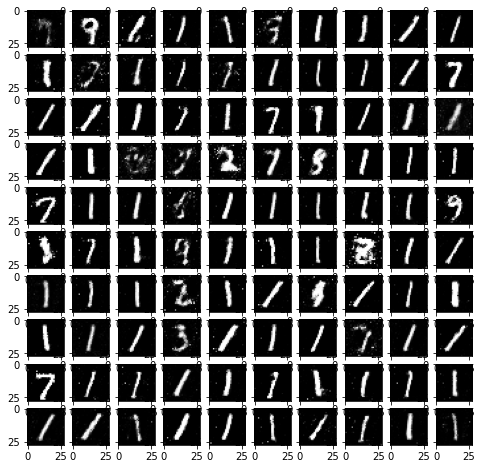

epoch : 44 D_loss : 0.0055225 G_loss :  0.016968


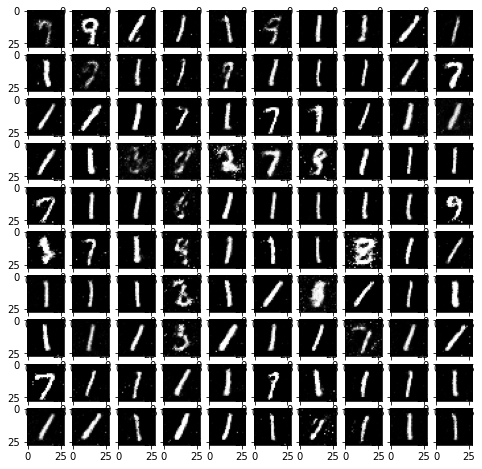

epoch : 45 D_loss : 0.0053039 G_loss :  0.018197


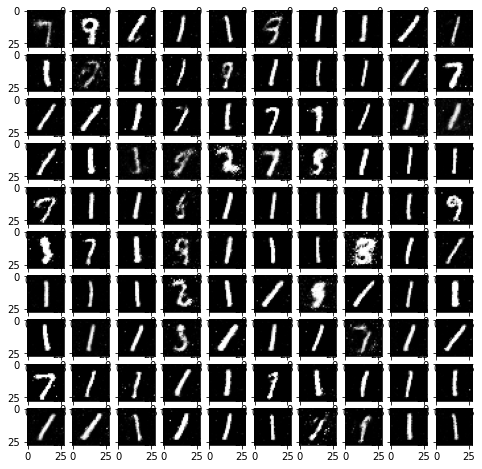

epoch : 46 D_loss : 0.0055315 G_loss :  0.017727


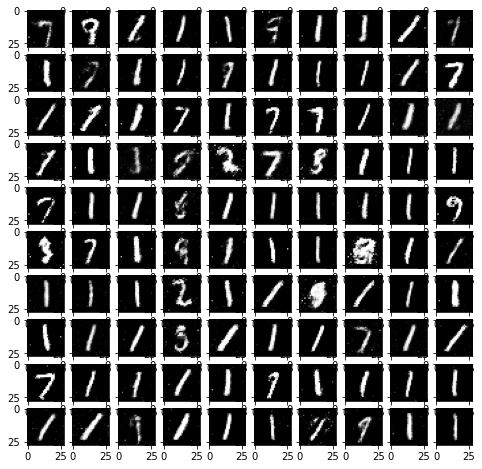

epoch : 47 D_loss : 0.0054343 G_loss :  0.01777


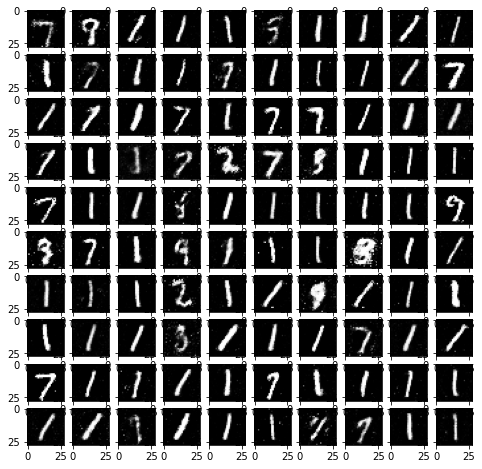

epoch : 48 D_loss : 0.0054778 G_loss :  0.017538


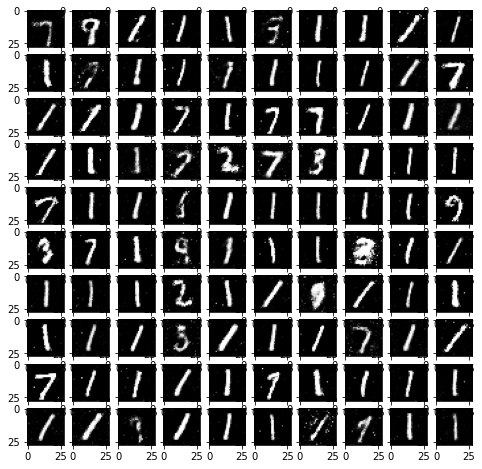

epoch : 49 D_loss : 0.0055955 G_loss :  0.017341


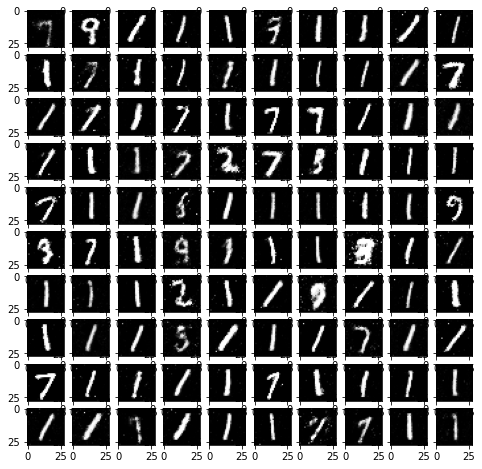

epoch : 50 D_loss : 0.0056879 G_loss :  0.016879


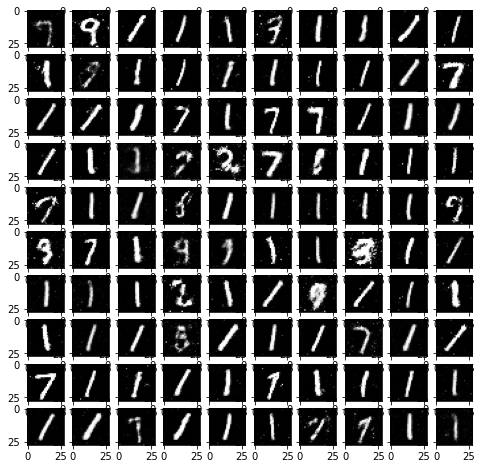

epoch : 51 D_loss : 0.0057886 G_loss :  0.016583


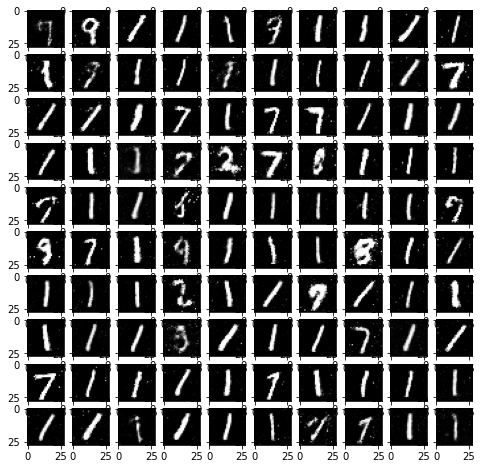

epoch : 52 D_loss : 0.0057407 G_loss :  0.016969


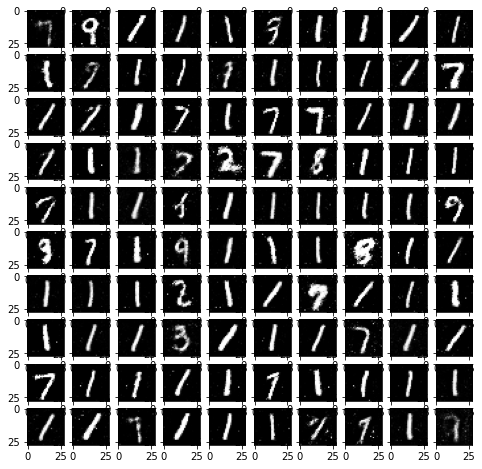

epoch : 53 D_loss : 0.0057158 G_loss :  0.016694


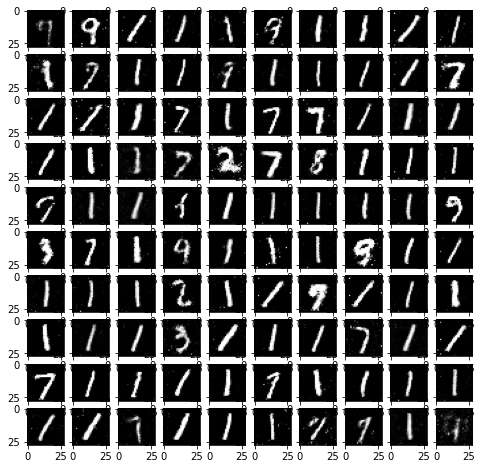

epoch : 54 D_loss : 0.0057778 G_loss :  0.016716


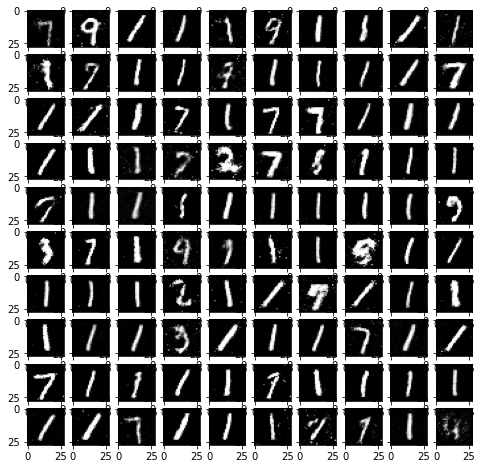

epoch : 55 D_loss : 0.0058196 G_loss :  0.016281


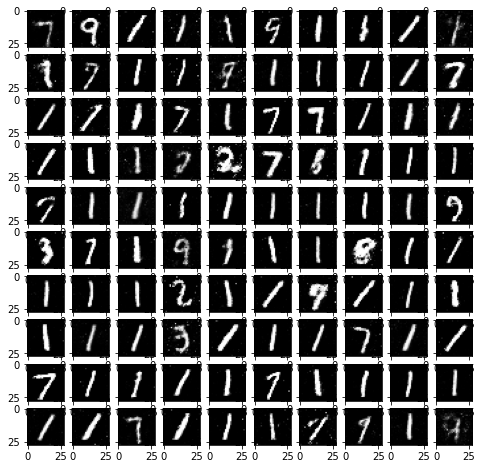

epoch : 56 D_loss : 0.0058829 G_loss :  0.016119


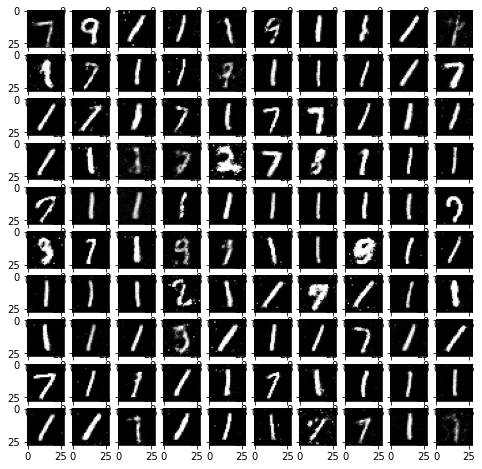

epoch : 57 D_loss : 0.0058918 G_loss :  0.01642


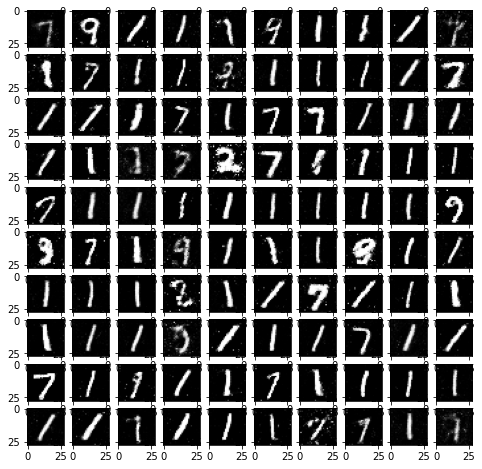

epoch : 58 D_loss : 0.0059317 G_loss :  0.016258


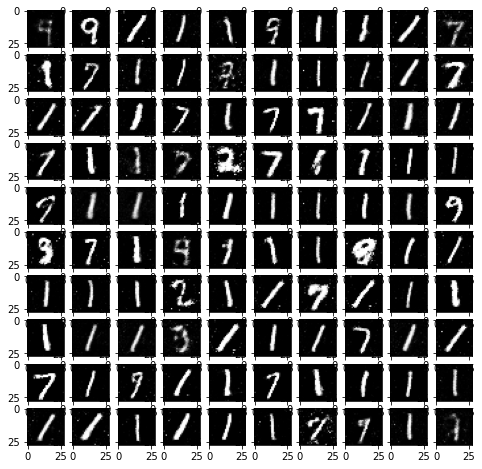

epoch : 59 D_loss : 0.0060653 G_loss :  0.015745


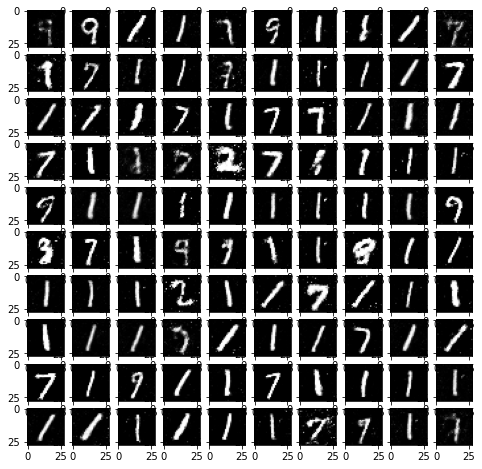

epoch : 60 D_loss : 0.0059365 G_loss :  0.016099


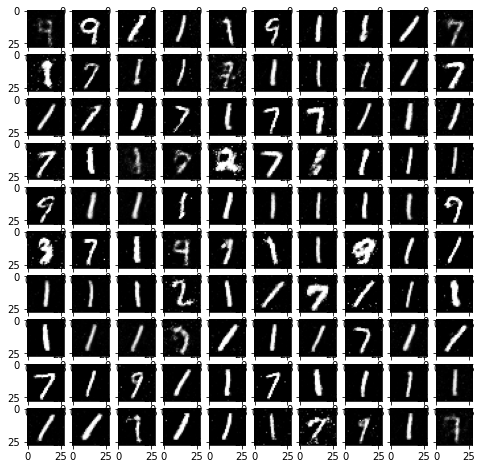

epoch : 61 D_loss : 0.0060047 G_loss :  0.015645


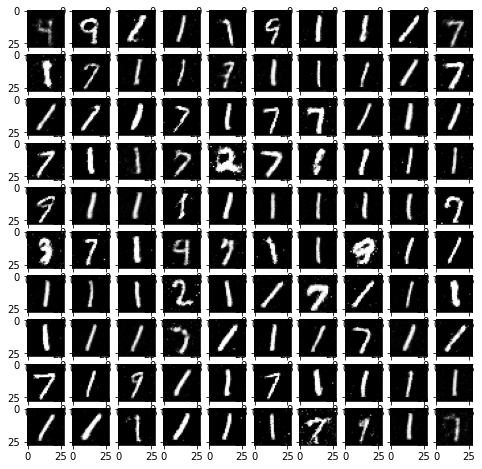

epoch : 62 D_loss : 0.0059413 G_loss :  0.015954


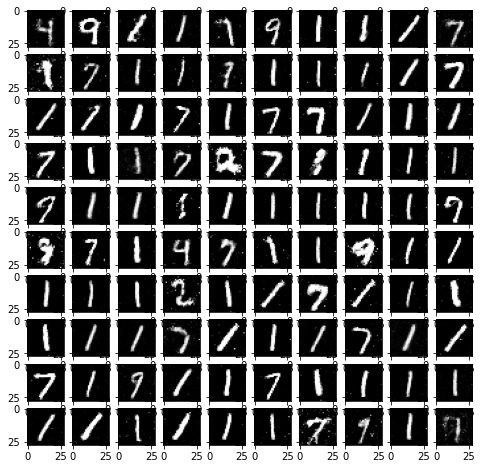

epoch : 63 D_loss : 0.0060322 G_loss :  0.015799


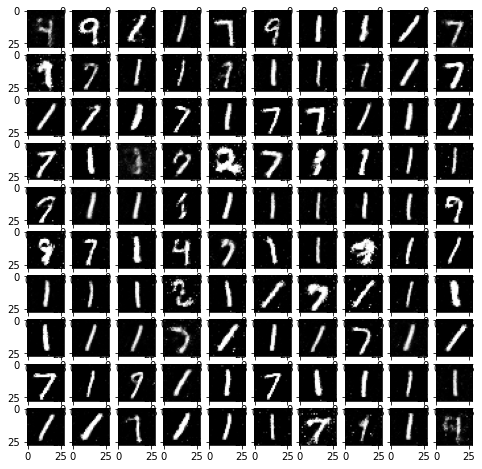

epoch : 64 D_loss : 0.006113 G_loss :  0.015609


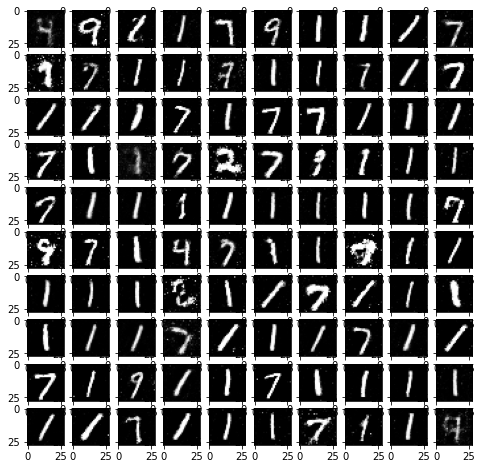

epoch : 65 D_loss : 0.006027 G_loss :  0.016291


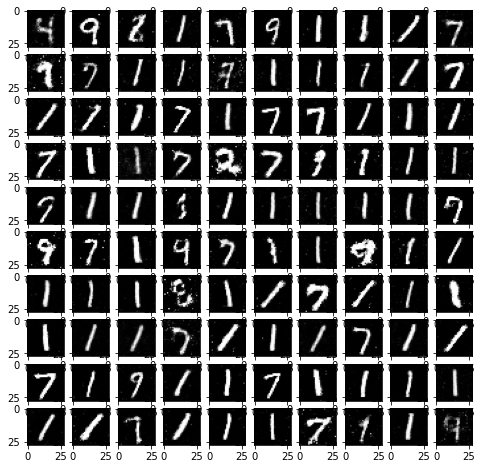

epoch : 66 D_loss : 0.0061112 G_loss :  0.015446


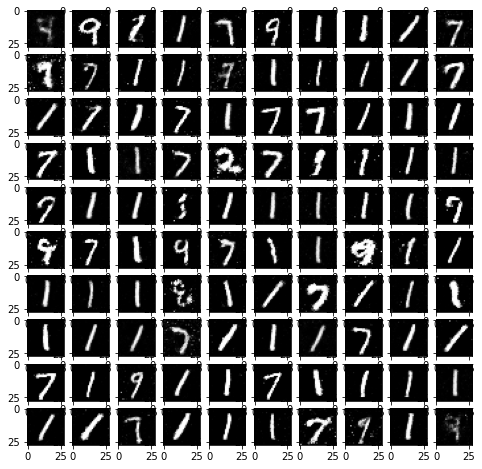

epoch : 67 D_loss : 0.006007 G_loss :  0.016059


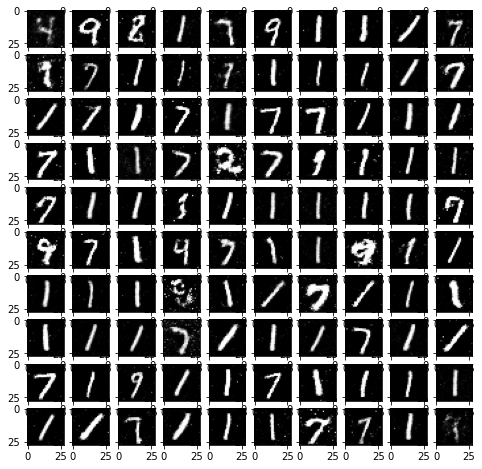

epoch : 68 D_loss : 0.006104 G_loss :  0.01544


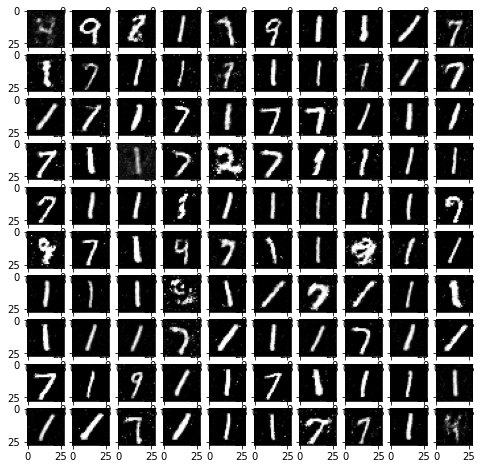

epoch : 69 D_loss : 0.005995 G_loss :  0.01582


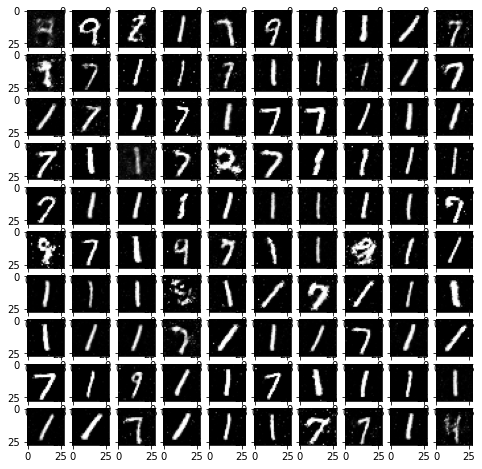

epoch : 70 D_loss : 0.0060571 G_loss :  0.015772


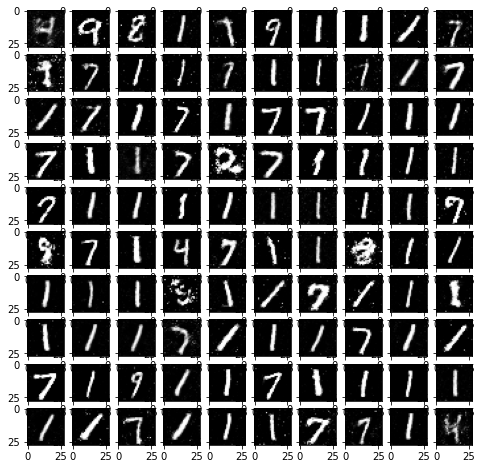

epoch : 71 D_loss : 0.006048 G_loss :  0.015752


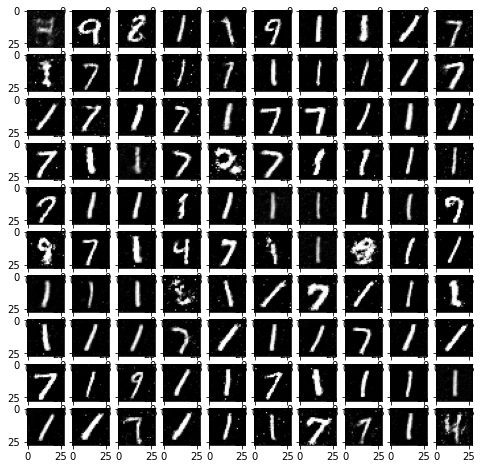

epoch : 72 D_loss : 0.006046 G_loss :  0.01538


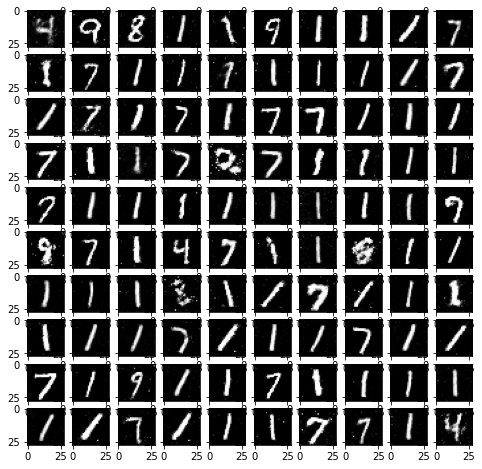

epoch : 73 D_loss : 0.0060454 G_loss :  0.015424


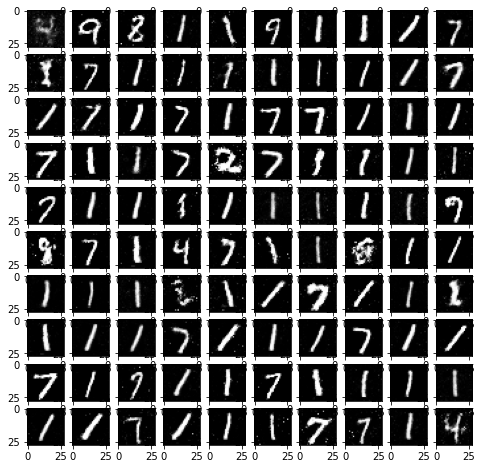

epoch : 74 D_loss : 0.0059849 G_loss :  0.015755


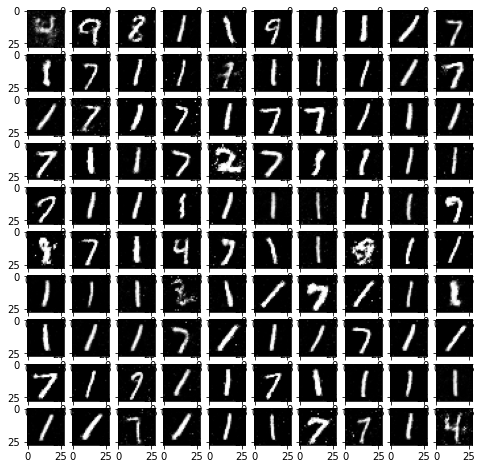

epoch : 75 D_loss : 0.005929 G_loss :  0.01601


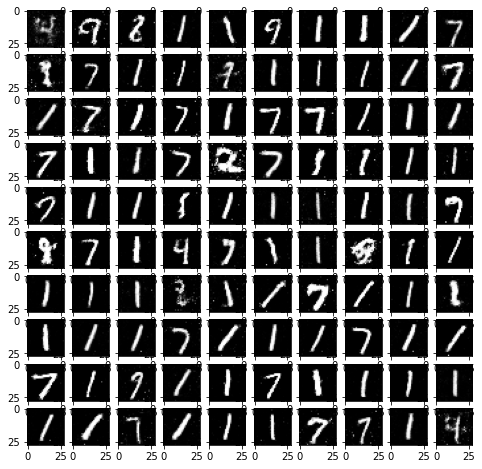

epoch : 76 D_loss : 0.0059464 G_loss :  0.015678


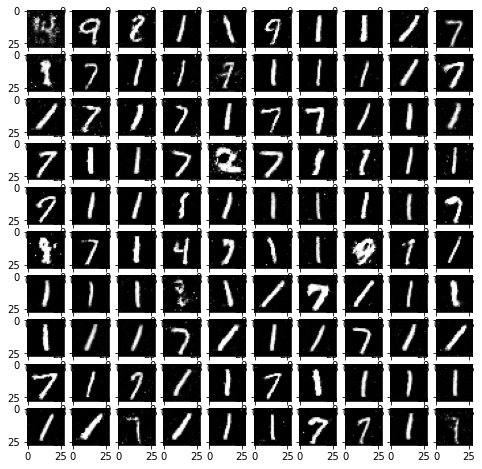

epoch : 77 D_loss : 0.0060108 G_loss :  0.015828


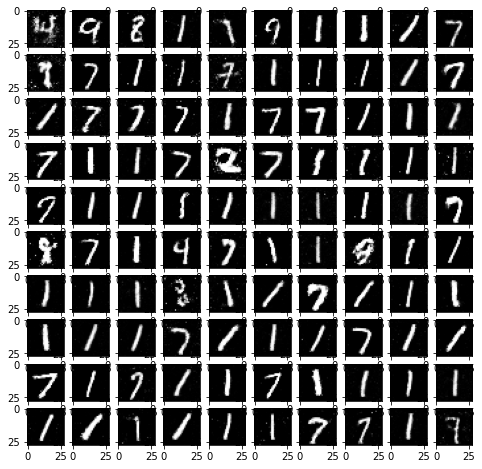

epoch : 78 D_loss : 0.0060953 G_loss :  0.015165


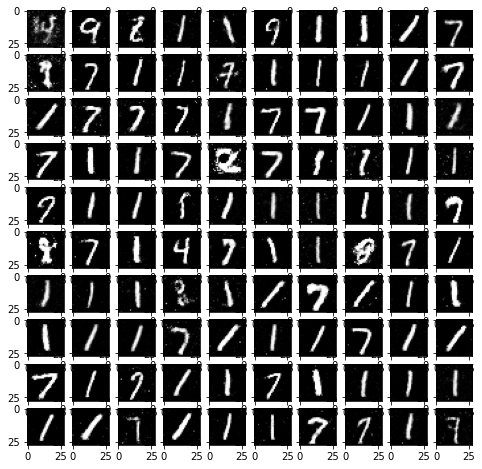

epoch : 79 D_loss : 0.006022 G_loss :  0.015646


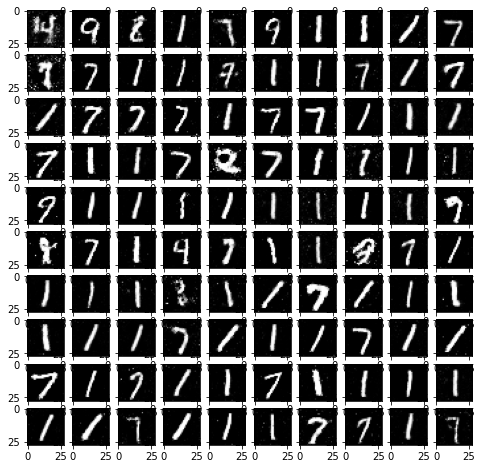

epoch : 80 D_loss : 0.0060535 G_loss :  0.01573


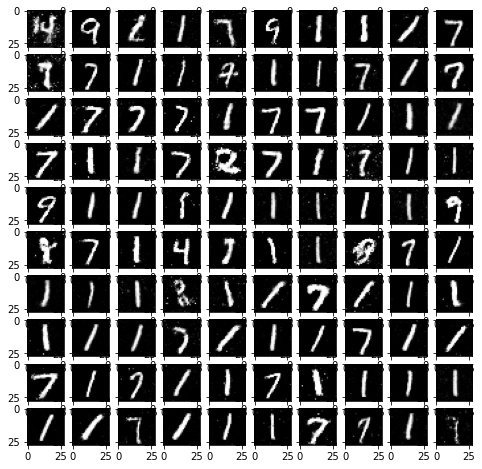

epoch : 81 D_loss : 0.0060712 G_loss :  0.015792


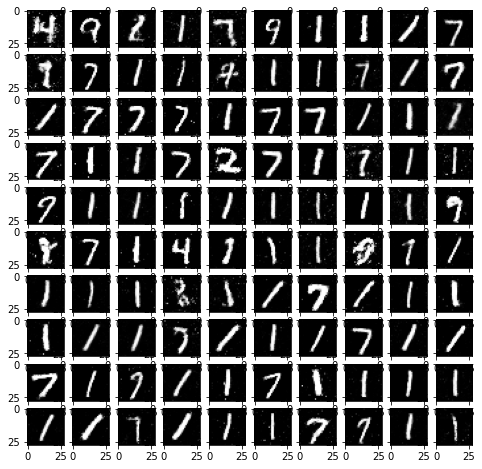

epoch : 82 D_loss : 0.0060756 G_loss :  0.015317


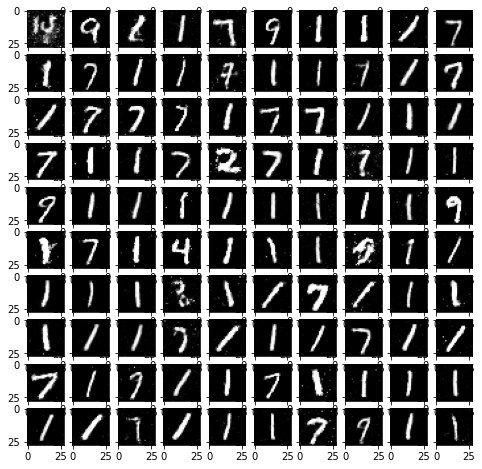

epoch : 83 D_loss : 0.0060336 G_loss :  0.015392


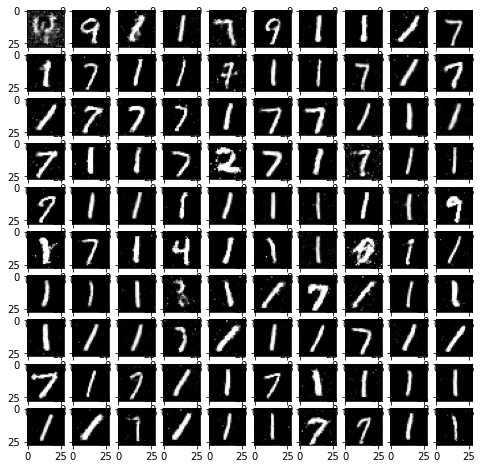

epoch : 84 D_loss : 0.0060111 G_loss :  0.015264


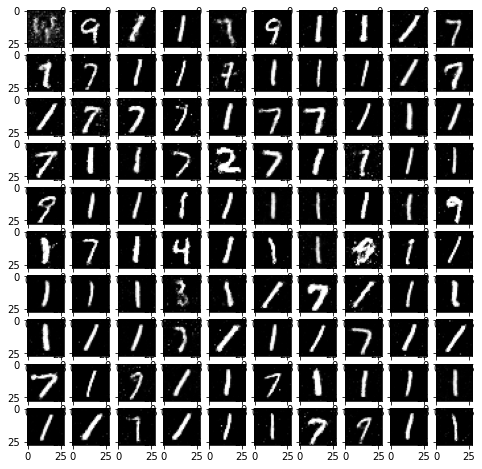

epoch : 85 D_loss : 0.0060241 G_loss :  0.01567


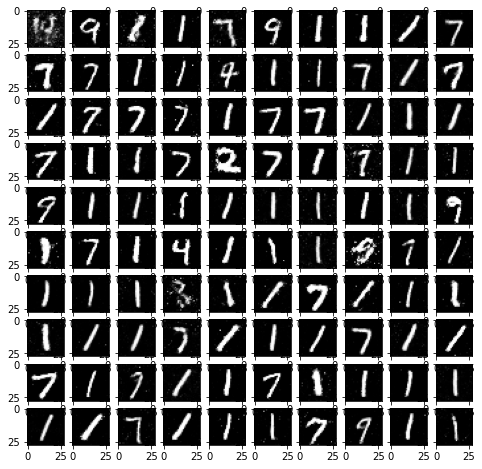

epoch : 86 D_loss : 0.0060601 G_loss :  0.015398


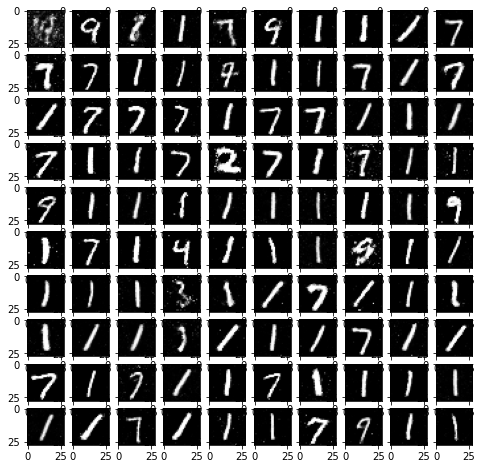

epoch : 87 D_loss : 0.0060633 G_loss :  0.015423


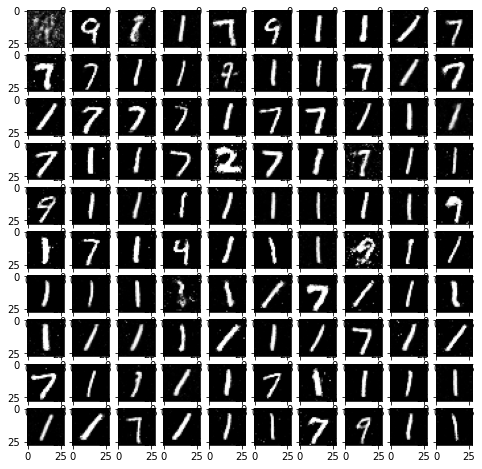

epoch : 88 D_loss : 0.0060488 G_loss :  0.015256


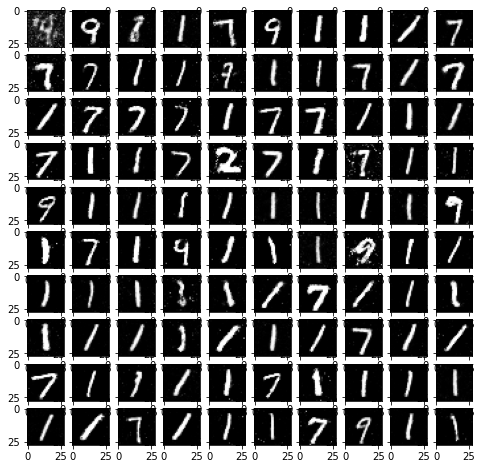

epoch : 89 D_loss : 0.0060282 G_loss :  0.015403


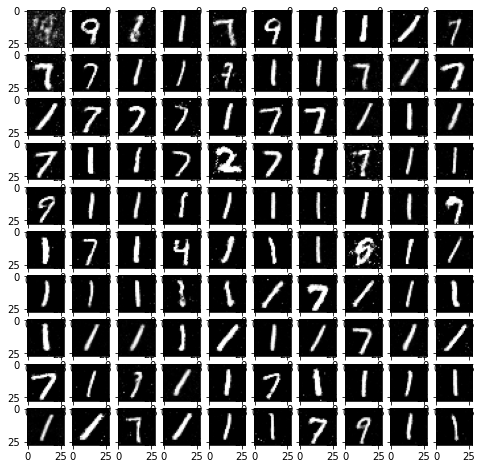

epoch : 90 D_loss : 0.0059761 G_loss :  0.015523


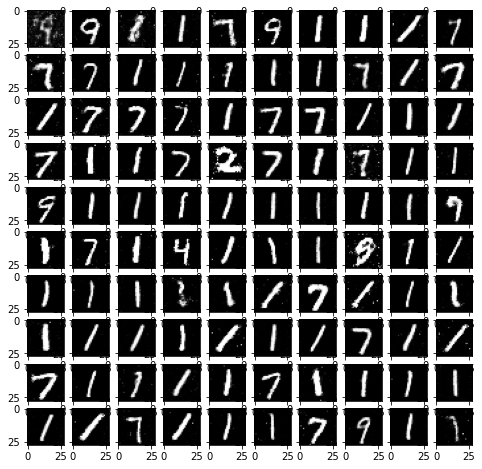

epoch : 91 D_loss : 0.0059798 G_loss :  0.015471


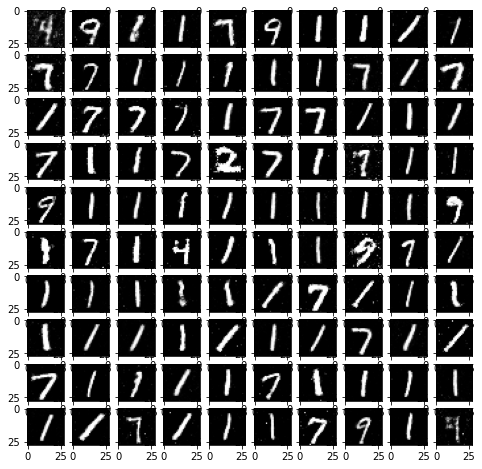

epoch : 92 D_loss : 0.0059716 G_loss :  0.015583


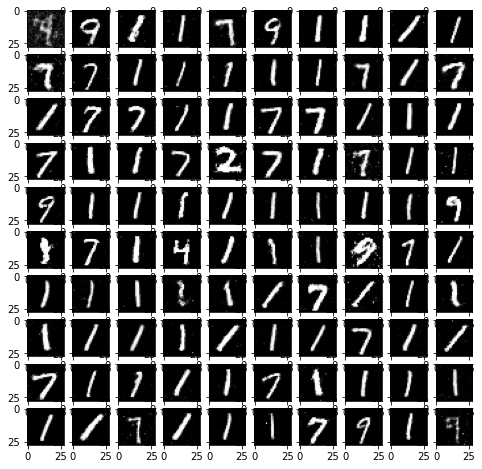

epoch : 93 D_loss : 0.0060482 G_loss :  0.015372


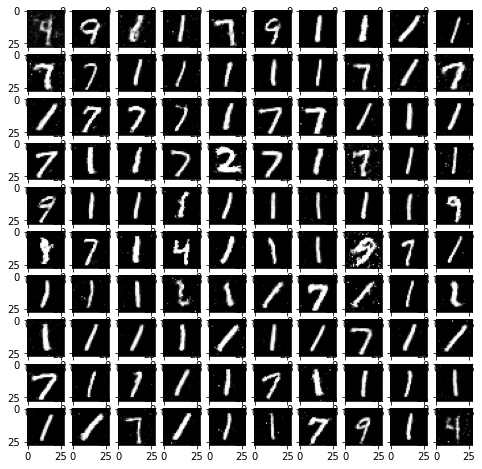

epoch : 94 D_loss : 0.0060623 G_loss :  0.015365


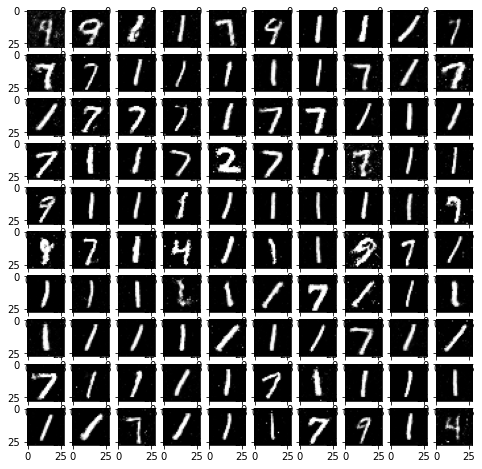

epoch : 95 D_loss : 0.0059907 G_loss :  0.015524


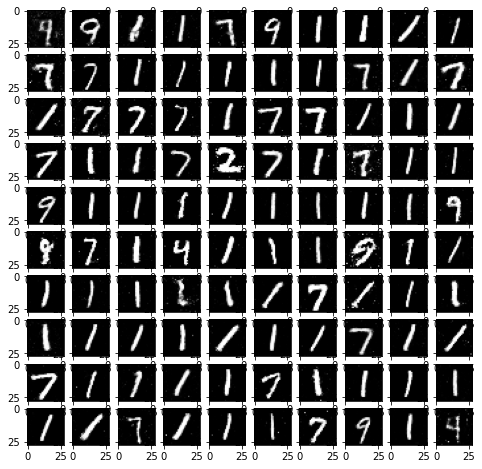

epoch : 96 D_loss : 0.0060051 G_loss :  0.01537


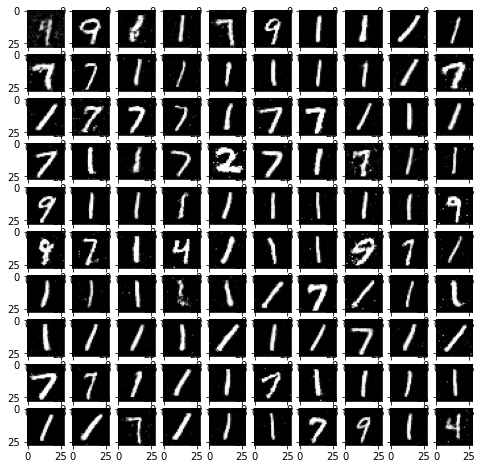

epoch : 97 D_loss : 0.0060218 G_loss :  0.015393


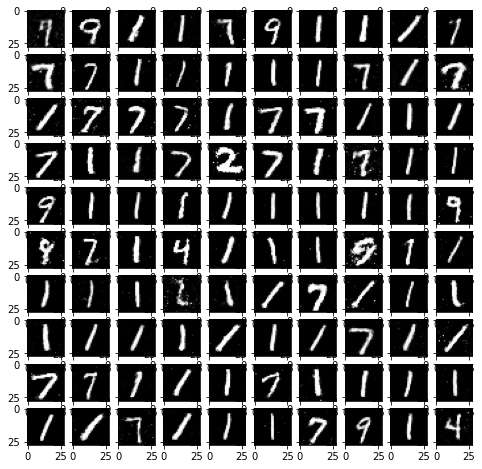

epoch : 98 D_loss : 0.0060368 G_loss :  0.015028


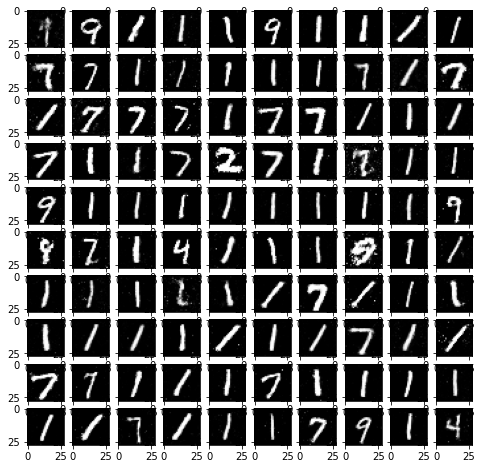

epoch : 99 D_loss : 0.0060027 G_loss :  0.015482


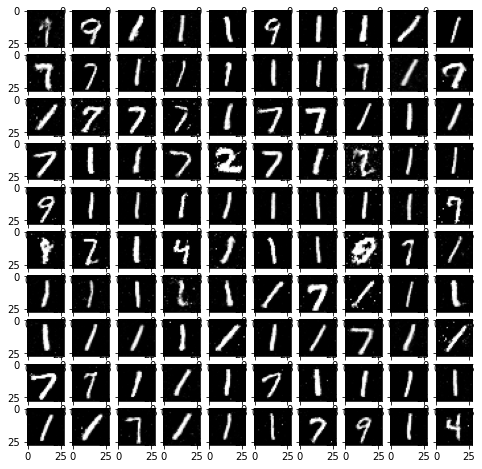

In [8]:
for epoch in range(epochs):
    D_loss_sum = 0
    G_loss_sum = 0

    for i, (image, _) in enumerate(data_iter):
        image = image.to(device)
        noise = torch.FloatTensor(np.random.randn(image.shape[0], 128)).to(device)
        real = torch.FloatTensor(np.ones((image.shape[0], 1))).to(device)
        fake = torch.zeros_like(real)

        # Discriminator
        G.eval()
        D.train()
        R_loss = critrion(D(image), real)
        D_optim.zero_grad()
        R_loss.backward()
        D_optim.step()
        
        F_loss = critrion(D(G(noise)), fake)
        F_loss.backward()
        D_optim.step()
        
        D_loss = R_loss + F_loss
        
        # Generator 
        G.train()
        D.eval()
        
        G_out = G(noise)
        G_loss = critrion(D(G_out), real)
        G_optim.zero_grad()
        G_loss.backward()
        G_optim.step()
        
        
        D_loss_sum += D_loss.item() / image.shape[0]
        G_loss_sum += G_loss.item() / image.shape[0]
    print(f"epoch : {epoch :02} D_loss : {D_loss_sum / len(data_iter) :.5} G_loss : {G_loss_sum / len(data_iter) : .5}")
    G.eval()
    with torch.no_grad():
        sample_out = G(sample_noise)
        show_image(sample_out.cpu(), epoch + 1)
    G.train()

In [13]:
import imageio
import glob
anim_file = './MINST_gan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('./generated_samples/sample*.png')
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)
print("finish")

finish
